<a href="https://colab.research.google.com/github/GeorgievskaEmilija/Data-Science-Lab-Exercises/blob/main/183044_Homework_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


<font size = 5 color='Orange'>
Learning Goals</font>

<font color = 'Orange' size = 4 >In this Exercise the main purpose is to learn the structure and features of the Neural Networks. Because the ANN are in every domain of Data Science the need for them knowledge is obligational. Therefore, in this Exercise you need to train different structures of NN's with main goal of finding the best 3 models for the given Dataset.</font>

<font color = 'Orange' size = 4 > Structure of the Dataset </font>

<font color = 'Orange'>
In this Dataset you have historical informations about the Bitcoin price in the next day and thirty days before.
<li>Target column (Y): Closе - closed price for the next day of the Bitcoin</li>
<li>X columns: Close_i {i e [1,30]}</li>
<li>Close_i: Closed price of the Bitcoin i days ago</li>

</font>



<font color = 'Orange' size = 4 > Train different NN's </font>
<ul>
<font color = 'Orange'>
Try to train different kinds of NN's structures
<li>Choose the number of layers your model will have</li>
<li>Choose the number of neurons in each hidden layer</li>
<li>Choose activation function for each layer: relu, sigmoid, softmax, softsign, linear,... </li>
<li>Choose the loss function for compiling: mean_squared_error, mean_absolute_error, root_mean_squared_error, ....</li>
<li>Choose the optimizer function for compiling: adam, adagrad, adamax, sgd,....</li>
<li>Choose the number of epochs and the batch size for the training part</li>
</ul>

<ul>

<font color = 'Orange'>
Save the three best models in a table with the given columns
<li>Number of the model</li>
<li>Number of layers</li>
<li>Number of neurons in each layer</li>
<li>Activation function for each layer</li>
<li>Loss function</li>
<li>Optimizer function for compiling</li>
<li>Number of epochs</li>
<li>Batch size</li>
<li>R2 score for the prediction of the test part (this is the metric for rating the models)</li>

</ul>
</font>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
data=pd.read_csv("/content/drive/MyDrive/Colab Notebooks/BTC_dataset.csv")
data=data.drop('Date',axis=1)
data.head()

,Close,Close_1,Close_2,Close_3,Close_4,Close_5,Close_6,Close_7,Close_8,Close_9,Close_10,Close_11,Close_12,Close_13,Close_14,Close_15,Close_16,Close_17,Close_18,Close_19,Close_20,Close_21,Close_22,Close_23,Close_24,Close_25,Close_26,Close_27,Close_28,Close_29,Close_30
0,823.984009,804.833984,777.757019,907.679016,902.828003,911.198975,908.585022,902.200989,1013.380005,1154.729980,1043.839966,1021.750000,998.325012,963.742981,961.237976,973.497009,975.921021,933.197998,907.609985,896.182983,898.822021,921.984009,864.539978,834.281006,800.875977,792.713989,790.530029,790.828979,784.906982,778.088013,781.481018
1,818.411987,823.984009,804.833984,777.757019,907.679016,902.828003,911.198975,908.585022,902.200989,1013.380005,1154.729980,1043.839966,1021.750000,998.325012,963.742981,961.237976,973.497009,975.921021,933.197998,907.609985,896.182983,898.822021,921.984009,864.539978,834.281006,800.875977,792.713989,790.530029,790.828979,784.906982,778.088013
2,821.797974,818.411987,823.984009,804.833984,777.757019,907.679016,902.828003,911.198975,908.585022,902.200989,1013.380005,1154.729980,1043.839966,1021.750000,998.325012,963.742981,961.237976,973.497009,975.921021,933.197998,907.609985,896.182983,898.822021,921.984009,864.539978,834.281006,800.875977,792.713989,790.530029,790.828979,784.906982
3,831.533997,821.797974,818.411987,823.984009,804.833984,777.757019,907.679016,902.828003,911.198975,908.585022,902.200989,1013.380005,1154.729980,1043.839966,1021.750000,998.325012,963.742981,961.237976,973.497009,975.921021,933.197998,907.609985,896.182983,898.822021,921.984009,864.539978,834.281006,800.875977,792.713989,790.530029,790.828979
4,907.937988,831.533997,821.797974,818.411987,823.984009,804.833984,777.757019,907.679016,902.828003,911.198975,908.585022,902.200989,1013.380005,1154.729980,1043.839966,1021.750000,998.325012,963.742981,961.237976,973.497009,975.921021,933.197998,907.609985,896.182983,898.822021,921.984009,864.539978,834.281006,800.875977,792.713989,790.530029


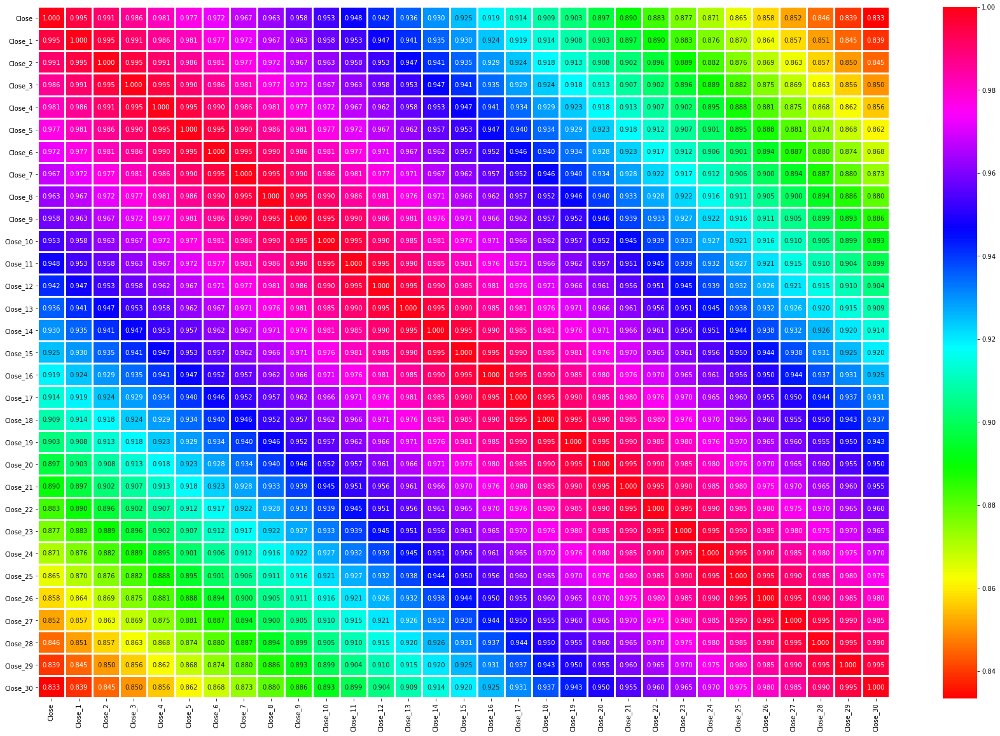

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline



plt.figure(figsize=(30,20))
sns.heatmap(data.corr(),annot=True,cmap='hsv',fmt='.3f',linewidths=2)
plt.show()

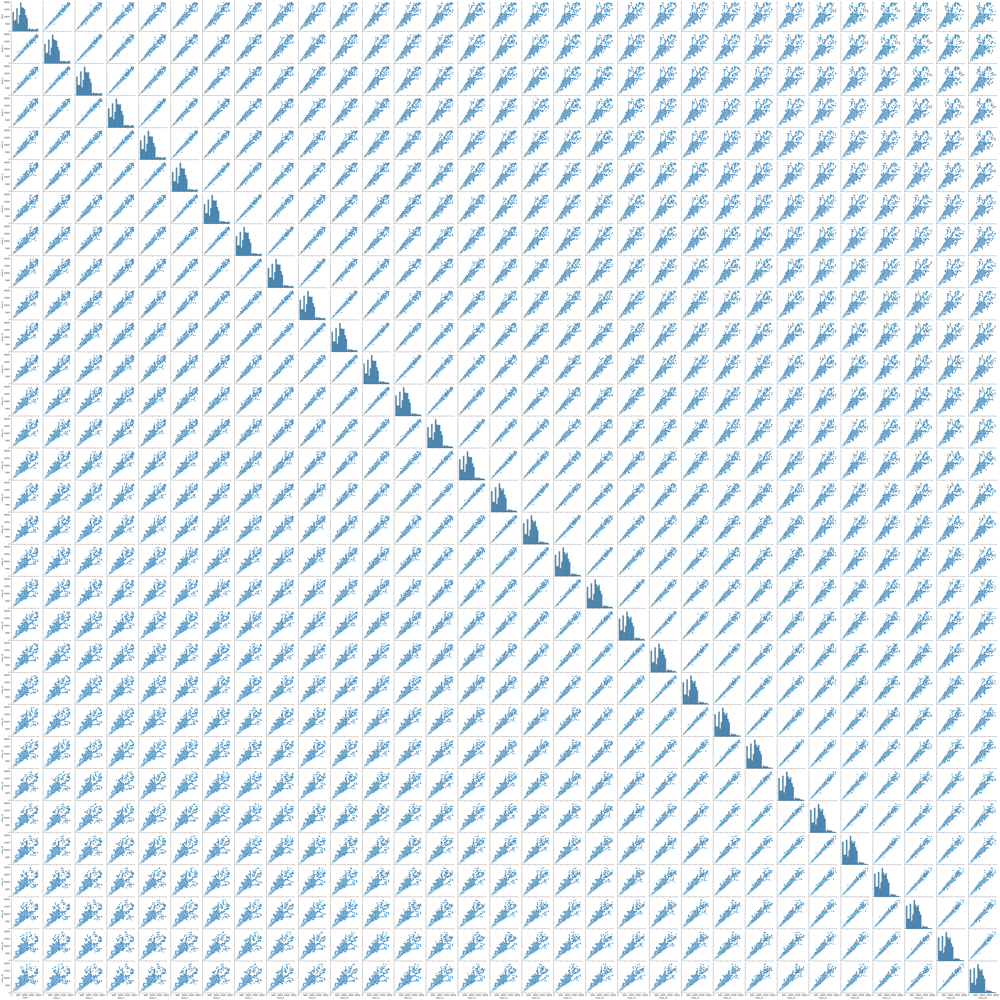

In [ ]:
sns.pairplot(data)

In [ ]:
#(1432, 31)
#train test split
from sklearn.model_selection import train_test_split
X = data.drop('Close', axis=1)
Y = data['Close']
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.2)

#scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
#model1

from keras.models import Sequential
from keras.layers import Dense
model1 = Sequential()
model1.add(Dense(32, input_dim=30, activation='relu'))
model1.add(Dense(16, activation='relu'))
model1.add(Dense(8, activation='relu'))
model1.add(Dense(1, activation='relu'))
model1.compile(loss='mean_squared_error', optimizer='adam') 
model1.fit(X_train, Y_train, epochs=20, batch_size=10)

#predikcija
y_pred1=model1.predict(X_test)

#evaluacija
from sklearn.metrics import r2_score
print("r_square score: ", r2_score(Y_test,y_pred1))

#info
allmodels=[]
from collections import OrderedDict
model1dict = OrderedDict()
model1dict['Name']='model 1'
model1dict['Layers']=4
model1dict['Neurons - Layer1']=32
model1dict['Neurons - Layer2']=16
model1dict['Neurons - Layer3']=8
model1dict['Neurons - Layer4']=1
model1dict['Activation function - Layer1']='relu'
model1dict['Activation function - Layer2']='relu'
model1dict['Activation function - Layer3']='relu'
model1dict['Activation function - Layer4']='relu'
model1dict['loss_function'] = 'mse'
model1dict['optimizer'] = 'adam'
model1dict['epochs'] = 20
model1dict['batch_size'] = 10
model1dict['r2_score'] = r2_score(Y_test,y_pred1)
allmodels.append(model1dict)

Epoch 1/20
115/115 [==============================] - 1s 2ms/step - loss: 64671812.7931
Epoch 2/20
115/115 [==============================] - 0s 2ms/step - loss: 66990098.7586
Epoch 3/20
115/115 [==============================] - 0s 2ms/step - loss: 53048387.9310
Epoch 4/20
115/115 [==============================] - 0s 2ms/step - loss: 26794071.5000
Epoch 5/20
115/115 [==============================] - 0s 2ms/step - loss: 18902591.6724
Epoch 6/20
115/115 [==============================] - 0s 2ms/step - loss: 19003642.6207
Epoch 7/20
115/115 [==============================] - 0s 2ms/step - loss: 17840173.0431
Epoch 8/20
115/115 [==============================] - 0s 2ms/step - loss: 18098653.3147
Epoch 9/20
115/115 [==============================] - 0s 2ms/step - loss: 16471457.6552
Epoch 10/20
115/115 [==============================] - 0s 2ms/step - loss: 16954917.8190
Epoch 11/20
115/115 [==============================] - 0s 2ms/step - loss: 14712799.4526
Epoch 12/20
115/115 [=========

In [ ]:
#model2

from keras.models import Sequential
from keras.layers import Dense
model2 = Sequential()
model2.add(Dense(32, input_dim=30, activation='relu'))
model2.add(Dense(16, activation='relu'))
model2.add(Dense(8, activation='relu'))
model2.add(Dense(1, activation='relu'))
model2.compile(loss='mean_squared_error', optimizer='adam') 
model2.fit(X_train, Y_train, epochs=30, batch_size=10)

#predikcija
y_pred2=model2.predict(X_test)

#evaluacija
from sklearn.metrics import r2_score
print("r_square score: ", r2_score(Y_test,y_pred2))

#info
from collections import OrderedDict
model2dict = OrderedDict()
model2dict['Name']='model 2'
model2dict['Layers']=4
model2dict['Neurons - Layer1']=32
model2dict['Neurons - Layer2']=16
model2dict['Neurons - Layer3']=8
model2dict['Neurons - Layer4']=1
model2dict['Activation function - Layer1']='relu'
model2dict['Activation function - Layer2']='relu'
model2dict['Activation function - Layer3']='relu'
model2dict['Activation function - Layer4']='relu'
model2dict['loss_function'] = 'mse'
model2dict['optimizer'] = 'adam'
model2dict['epochs'] = 30
model2dict['batch_size'] = 10
model2dict['r2_score'] = r2_score(Y_test,y_pred2)
allmodels.append(model2dict)

Epoch 1/30
115/115 [==============================] - 1s 2ms/step - loss: 68799829.9310
Epoch 2/30
115/115 [==============================] - 0s 2ms/step - loss: 64872122.5862
Epoch 3/30
115/115 [==============================] - 0s 2ms/step - loss: 50649680.5862
Epoch 4/30
115/115 [==============================] - 0s 2ms/step - loss: 25004273.9310
Epoch 5/30
115/115 [==============================] - 0s 2ms/step - loss: 18666339.0345
Epoch 6/30
115/115 [==============================] - 0s 2ms/step - loss: 17528302.9483
Epoch 7/30
115/115 [==============================] - 0s 2ms/step - loss: 16949222.9310
Epoch 8/30
115/115 [==============================] - 0s 2ms/step - loss: 17273245.1552
Epoch 9/30
115/115 [==============================] - 0s 2ms/step - loss: 16911998.0862
Epoch 10/30
115/115 [==============================] - 0s 2ms/step - loss: 14869170.9138
Epoch 11/30
115/115 [==============================] - 0s 2ms/step - loss: 13339300.6983
Epoch 12/30
115/115 [=========

In [ ]:
#model3

from keras.models import Sequential
from keras.layers import Dense
model3 = Sequential()
model3.add(Dense(30, input_dim=30, activation='relu'))
model3.add(Dense(15, activation='relu'))
model3.add(Dense(7, activation='relu'))
model3.add(Dense(1, activation='relu'))
model3.compile(loss='mean_squared_error', optimizer='adam') 
model3.fit(X_train, Y_train, epochs=45, batch_size=10)

#predikcija
y_pred3=model3.predict(X_test)

#evaluacija
from sklearn.metrics import r2_score
print("r_square score: ", r2_score(Y_test,y_pred3))

#info
from collections import OrderedDict
model3dict = OrderedDict()
model3dict['Name']='model 3'
model3dict['Layers']=4
model3dict['Neurons - Layer1']=30
model3dict['Neurons - Layer2']=15
model3dict['Neurons - Layer3']=7
model3dict['Neurons - Layer4']=1
model3dict['Activation function - Layer1']='relu'
model3dict['Activation function - Layer2']='relu'
model3dict['Activation function - Layer3']='relu'
model3dict['Activation function - Layer4']='relu'
model3dict['loss_function'] = 'mse'
model3dict['optimizer'] = 'adam'
model3dict['epochs'] = 45
model3dict['batch_size'] = 10
model3dict['r2_score'] = r2_score(Y_test,y_pred3)
allmodels.append(model3dict)

Epoch 1/45
115/115 [==============================] - 1s 2ms/step - loss: 67013811.5862
Epoch 2/45
115/115 [==============================] - 0s 2ms/step - loss: 67463399.0690
Epoch 3/45
115/115 [==============================] - 0s 2ms/step - loss: 62818880.7586
Epoch 4/45
115/115 [==============================] - 0s 2ms/step - loss: 41572551.8621
Epoch 5/45
115/115 [==============================] - 0s 2ms/step - loss: 22860114.0000
Epoch 6/45
115/115 [==============================] - 0s 2ms/step - loss: 16941199.6724
Epoch 7/45
115/115 [==============================] - 0s 2ms/step - loss: 18501506.5690
Epoch 8/45
115/115 [==============================] - 0s 2ms/step - loss: 16702507.5690
Epoch 9/45
115/115 [==============================] - 0s 2ms/step - loss: 17112892.9828
Epoch 10/45
115/115 [==============================] - 0s 2ms/step - loss: 16610616.8793
Epoch 11/45
115/115 [==============================] - 0s 2ms/step - loss: 16071880.9397
Epoch 12/45
115/115 [=========

In [ ]:
#model4

from keras.models import Sequential
from keras.layers import Dense
model4 = Sequential()
model4.add(Dense(32, input_dim=30, activation='linear'))
model4.add(Dense(16, activation='linear'))
model4.add(Dense(8, activation='linear'))
model4.add(Dense(1, activation='linear'))
model4.compile(loss='mean_squared_error', optimizer='adam') 
model4.fit(X_train, Y_train, epochs=30, batch_size=20)

#predikcija
y_pred4=model4.predict(X_test)

#evaluacija
from sklearn.metrics import r2_score
print("r_square score: ", r2_score(Y_test,y_pred4))


#info
from collections import OrderedDict
model4dict = OrderedDict()
model4dict['Name']='model 4'
model4dict['Layers']=4
model4dict['Neurons - Layer1']=32
model4dict['Neurons - Layer2']=16
model4dict['Neurons - Layer3']=8
model4dict['Neurons - Layer4']=1
model4dict['Activation function - Layer1']='linear'
model4dict['Activation function - Layer2']='linear'
model4dict['Activation function - Layer3']='linear'
model4dict['Activation function - Layer4']='linear'
model4dict['loss_function'] = 'mse'
model4dict['optimizer'] = 'adam'
model4dict['epochs'] = 30
model4dict['batch_size'] = 20
model4dict['r2_score'] = r2_score(Y_test,y_pred4)
allmodels.append(model4dict)


Epoch 1/30
58/58 [==============================] - 0s 2ms/step - loss: 65863955.5932
Epoch 2/30
58/58 [==============================] - 0s 2ms/step - loss: 69344471.9322
Epoch 3/30
58/58 [==============================] - 0s 2ms/step - loss: 65500132.0000
Epoch 4/30
58/58 [==============================] - 0s 2ms/step - loss: 56302022.3729
Epoch 5/30
58/58 [==============================] - 0s 2ms/step - loss: 52937359.6610
Epoch 6/30
58/58 [==============================] - 0s 2ms/step - loss: 51242584.5424
Epoch 7/30
58/58 [==============================] - 0s 2ms/step - loss: 50744422.3729
Epoch 8/30
58/58 [==============================] - 0s 2ms/step - loss: 49475174.1695
Epoch 9/30
58/58 [==============================] - 0s 2ms/step - loss: 49165589.1525
Epoch 10/30
58/58 [==============================] - 0s 2ms/step - loss: 47092879.9322
Epoch 11/30
58/58 [==============================] - 0s 2ms/step - loss: 45056179.3898
Epoch 12/30
58/58 [==============================] -

In [ ]:
#model5

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout

model5 = Sequential()
model5.add(Dense(32, input_dim=30, activation='linear'))
model5.add(Dropout(0.3, input_shape=(32,)))
model5.add(Dense(16, activation='linear'))
model5.add(Dropout(0.3, input_shape=(16,)))
model5.add(Dense(8, activation='linear'))
model5.add(Dense(1, activation='linear'))
model5.compile(loss='mean_squared_error', optimizer='adam') 
model5.fit(X_train, Y_train, epochs=40, batch_size=10)

#predikcija
y_pred5=model5.predict(X_test)

#evaluacija
from sklearn.metrics import r2_score
print("r_square score: ", r2_score(Y_test,y_pred5))

#info
from collections import OrderedDict
model5dict = OrderedDict()
model5dict['Name']='model 5'
model5dict['Layers']=6
model5dict['Neurons - Layer1']=32
model5dict['Neurons - Layer2']=16
model5dict['Neurons - Layer3']=8
model5dict['Neurons - Layer4']=1
model5dict['Activation function - Layer1']='linear'
model5dict['Activation function - Layer2']='linear'
model5dict['Activation function - Layer3']='linear'
model5dict['Activation function - Layer4']='linear'
model5dict['loss_function'] = 'mse'
model5dict['optimizer'] = 'adam'
model5dict['epochs'] = 40
model5dict['batch_size'] = 10
model5dict['r2_score'] = r2_score(Y_test,y_pred5)
allmodels.append(model5dict)

Epoch 1/40
115/115 [==============================] - 1s 2ms/step - loss: 64160701.4483
Epoch 2/40
115/115 [==============================] - 0s 2ms/step - loss: 63665214.0690
Epoch 3/40
115/115 [==============================] - 0s 2ms/step - loss: 57015664.7586
Epoch 4/40
115/115 [==============================] - 0s 2ms/step - loss: 52461212.8276
Epoch 5/40
115/115 [==============================] - 0s 2ms/step - loss: 50170427.0345
Epoch 6/40
115/115 [==============================] - 0s 2ms/step - loss: 47660670.8966
Epoch 7/40
115/115 [==============================] - 0s 2ms/step - loss: 45793453.7931
Epoch 8/40
115/115 [==============================] - 0s 2ms/step - loss: 42022399.6897
Epoch 9/40
115/115 [==============================] - 0s 2ms/step - loss: 35234982.7241
Epoch 10/40
115/115 [==============================] - 0s 2ms/step - loss: 26931339.0517
Epoch 11/40
115/115 [==============================] - 0s 2ms/step - loss: 15527537.4569
Epoch 12/40
115/115 [=========

In [ ]:
#model6

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout

model6 = Sequential()
model6.add(Dense(40, input_dim=30, activation='tanh'))
model6.add(Dropout(0.8, input_shape=(32,)))
model6.add(Dense(20, activation='tanh'))
model6.add(Dropout(0.2, input_shape=(16,)))
model6.add(Dense(10, activation='tanh'))
model6.add(Dropout(0.3, input_shape=(8,)))
model6.add(Dense(1, activation='tanh'))
model6.compile(loss='mean_squared_error', optimizer='adam') 
model6.fit(X_train, Y_train, epochs=80, batch_size=20)

#predikcija
y_pred6=model6.predict(X_test)

#evaluacija
from sklearn.metrics import r2_score
print("r_square score: ", r2_score(Y_test,y_pred6))

#info
from collections import OrderedDict
model6dict = OrderedDict()
model6dict['Name']='model 6'
model6dict['Layers']=7
model6dict['Neurons - Layer1']=40
model6dict['Neurons - Layer2']=20
model6dict['Neurons - Layer3']=10
model6dict['Neurons - Layer4']=1
model6dict['Activation function - Layer1']='tanh'
model6dict['Activation function - Layer2']='tanh'
model6dict['Activation function - Layer3']='tanh'
model6dict['Activation function - Layer4']='tanh'
model6dict['loss_function'] = 'mse'
model6dict['optimizer'] = 'adam'
model6dict['epochs'] = 80
model6dict['batch_size'] = 20
model6dict['r2_score'] = r2_score(Y_test,y_pred6)
allmodels.append(model6dict)


Epoch 1/80
58/58 [==============================] - 0s 2ms/step - loss: 66759710.5763
Epoch 2/80
58/58 [==============================] - 0s 2ms/step - loss: 67597260.6102
Epoch 3/80
58/58 [==============================] - 0s 2ms/step - loss: 67766636.6102
Epoch 4/80
58/58 [==============================] - 0s 2ms/step - loss: 70511056.5424
Epoch 5/80
58/58 [==============================] - 0s 2ms/step - loss: 68024808.5424
Epoch 6/80
58/58 [==============================] - 0s 2ms/step - loss: 67442961.2881
Epoch 7/80
58/58 [==============================] - 0s 2ms/step - loss: 67227760.5424
Epoch 8/80
58/58 [==============================] - 0s 2ms/step - loss: 71248669.9661
Epoch 9/80
58/58 [==============================] - 0s 2ms/step - loss: 66825054.1017
Epoch 10/80
58/58 [==============================] - 0s 2ms/step - loss: 68703398.9831
Epoch 11/80
58/58 [==============================] - 0s 2ms/step - loss: 65284005.8983
Epoch 12/80
58/58 [==============================] -

In [ ]:
#model7

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout

model7 = Sequential()
model7.add(Dense(32, input_dim=30, activation='linear'))
model7.add(Dense(16, activation='linear'))
model7.add(Dense(8, activation='linear'))
model7.add(Dropout(0.1, input_shape=(8,)))
model7.add(Dense(1, activation='linear'))
model7.compile(loss='mean_squared_error', optimizer='adam') 
model7.fit(X_train, Y_train, epochs=120, batch_size=25)

#predikcija
y_pred7=model7.predict(X_test)

#evaluacija
from sklearn.metrics import r2_score
print("r_square score: ", r2_score(Y_test,y_pred7))

#info
from collections import OrderedDict
model7dict = OrderedDict()
model7dict['Name']='model 7'
model7dict['Layers']=5
model7dict['Neurons - Layer1']=32
model7dict['Neurons - Layer2']=16
model7dict['Neurons - Layer3']=8
model7dict['Neurons - Layer4']=1
model7dict['Activation function - Layer1']='linear'
model7dict['Activation function - Layer2']='linear'
model7dict['Activation function - Layer3']='linear'
model7dict['Activation function - Layer4']='linear'
model7dict['loss_function'] = 'mse'
model7dict['optimizer'] = 'adam'
model7dict['epochs'] = 120
model7dict['batch_size'] = 25
model7dict['r2_score'] = r2_score(Y_test,y_pred6)
allmodels.append(model7dict)

Epoch 1/120
46/46 [==============================] - 0s 2ms/step - loss: 67765088.0851
Epoch 2/120
46/46 [==============================] - 0s 2ms/step - loss: 66245520.7660
Epoch 3/120
46/46 [==============================] - 0s 2ms/step - loss: 65784861.2766
Epoch 4/120
46/46 [==============================] - 0s 2ms/step - loss: 63702614.6383
Epoch 5/120
46/46 [==============================] - 0s 2ms/step - loss: 55567842.9787
Epoch 6/120
46/46 [==============================] - 0s 2ms/step - loss: 51786649.7021
Epoch 7/120
46/46 [==============================] - 0s 2ms/step - loss: 52160130.2979
Epoch 8/120
46/46 [==============================] - 0s 2ms/step - loss: 51345042.6383
Epoch 9/120
46/46 [==============================] - 0s 2ms/step - loss: 49775875.6596
Epoch 10/120
46/46 [==============================] - 0s 2ms/step - loss: 48517944.7660
Epoch 11/120
46/46 [==============================] - 0s 2ms/step - loss: 49057410.8936
Epoch 12/120
46/46 [=====================

In [ ]:
from operator import itemgetter
newlist = sorted(allmodels, key=lambda k: k['r2_score'],reverse=True) 
best=newlist[:3]

matrix = []
for i in range(0,3):
  matrix.append(list(best[i].values()))
df = pd.DataFrame(np.array(matrix), columns=list(model1dict.keys()))
df

,Name,Layers,Neurons - Layer1,Neurons - Layer2,Neurons - Layer3,Neurons - Layer4,Activation function - Layer1,Activation function - Layer2,Activation function - Layer3,Activation function - Layer4,loss_function,optimizer,epochs,batch_size,r2_score
0,model 3,4,30,15,7,1,relu,relu,relu,relu,mse,adam,45,10,0.9814691879608173
1,model 4,4,32,16,8,1,linear,linear,linear,linear,mse,adam,30,20,0.9799042280038461
2,model 5,6,32,16,8,1,linear,linear,linear,linear,mse,adam,40,10,0.9760272317882964
